# 0. Imports

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_validate
from sklearn.model_selection import StratifiedKFold

from tqdm.notebook import tqdm

from lightgbm import LGBMClassifier
import lightgbm as lgb

import optuna
from category_encoders import CountEncoder
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.base import clone

In [2]:
%config InlineBackend.figure_format = 'retina'
sns.set_theme(style='darkgrid', palette='deep', font_scale=1.2)

In [3]:
OPTUNA_STORAGE = "sqlite:///experiments.db"

# 1. Initial data analysis and preprocessing

В даннном блоке сделаем минимально необходимый анализ данных, необходимый для построения baselin'a:

## 1.1. Data types

In [4]:
data_train = pd.read_csv('data/train.csv')
data_test = pd.read_csv('data/test.csv')

In [128]:
print(f"Train data shape = {data_train.shape}")
print(f"Test data shape = {data_test.shape}")

Train data shape = (200000, 402)
Test data shape = (200000, 401)


In [6]:
np.setdiff1d(data_train.columns.to_numpy(), data_test.columns.to_numpy())

array(['target'], dtype=object)

In [7]:
data_train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


Видно, что все данные, кроме `ID_code` численные:

In [8]:
data_train.drop(columns=["target"]).select_dtypes("number").dtypes.value_counts()

float64    200
Name: count, dtype: int64

## 1.2 Missing values

In [9]:
data_train.isna().sum().sum(), data_test.isna().sum().sum()

(np.int64(0), np.int64(0))

Никаких пропусков в данных нет.

## 1.3 `ID_code`

Также проверим уникальность `ID_code`: 

In [10]:
assert data_train.ID_code.nunique() == data_train.shape[0]
assert data_test.ID_code.nunique() == data_test.shape[0]

## 1.4 Target Analysis

In [11]:
data_train.target.value_counts()

target
0    179902
1     20098
Name: count, dtype: int64

In [12]:
data_train.target.value_counts()/data_train.shape[0]

target
0    0.89951
1    0.10049
Name: count, dtype: float64

**Мини-вывод:**
Выборка является несбалансированной, отношение положительного класса к отрицательному = 1:9

Также проверим распределение таргета в зависимости от его индекса в данных. Это может помочь найти скрытые за анонимизацией признаков временные зависимости в данных. 

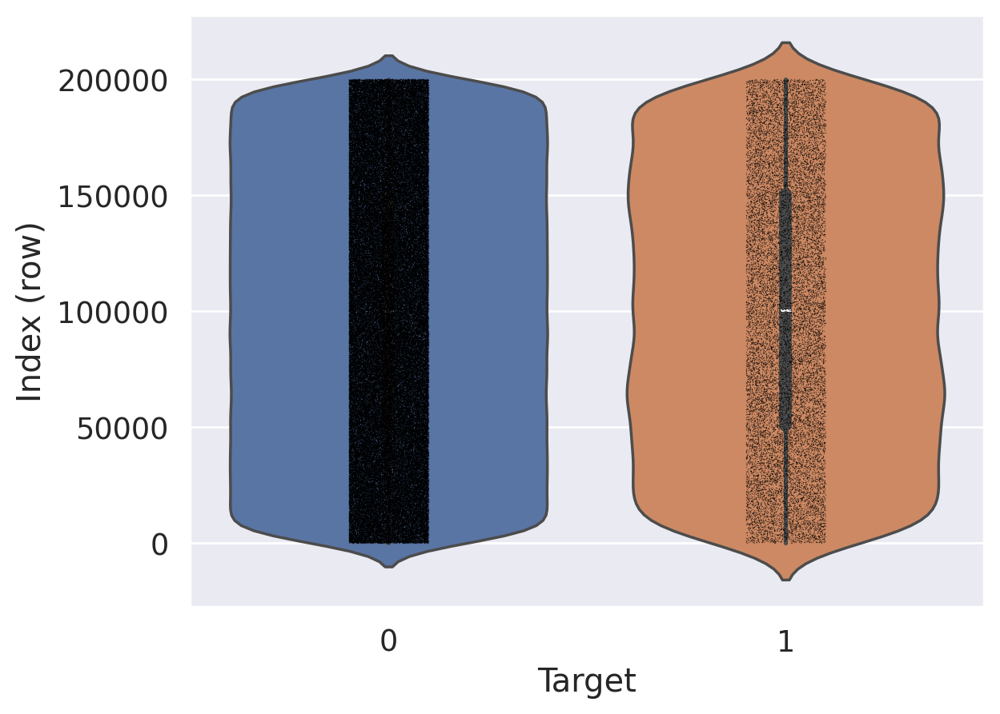

In [14]:
sns.violinplot(x=data_train.target.values, y=data_train.index.values,
               hue=data_train.target.values, legend=False)
sns.stripplot(x=data_train.target.values, y=data_train.index.values,
              jitter=True, color="black", size=0.5, alpha=0.5)

plt.xlabel("Target")
plt.ylabel("Index (row)");

**Мини-вывод:**
- Распределение целевой переменной (и для 0, и для 1) в зависимости от индекса является равномерным. Это говорит о том, что в выборке нет скрытых временных зависимостей, которые надо учитывать и дает возможность применять `StratifierdKFold` вместо обычного `KFold`. Также такое идеальное равномерное распределение (особенно для ц.п = 0) может свидетельствовать, что данные не являются реальными, а были сгенерированы/предварительно специально обработаны.

## 1.5 Features analysis

In [15]:
data_train.drop(columns=["target"]).describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,7.567236,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,1.235070,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,3.970500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,6.618800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,7.629600,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,8.584425,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,11.150600,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [14]:
print(f"Min `std` of features = {data_train.drop(columns=["target"]).describe().T["std"].min():.4f}")
print(f"Mean `std` of features = {data_train.drop(columns=["target"]).describe().T["std"].mean():.4f}")
print(f"Max `std` of features = {data_train.drop(columns=["target"]).describe().T["std"].max():.4f}")

Min `std` of features = 0.0072
Mean `std` of features = 4.4946
Max `std` of features = 21.4049


In [15]:
print(f"Min `mean` of features = {data_train.drop(columns=["target"]).describe().T["mean"].min():.4f}")
print(f"Mean `mean` of features = {data_train.drop(columns=["target"]).describe().T["mean"].mean():.4f}")
print(f"Max `mean` of features = {data_train.drop(columns=["target"]).describe().T["mean"].max():.4f}")

Min `mean` of features = -16.5481
Mean `mean` of features = 6.7674
Max `mean` of features = 24.5211


**Мини-вывод:**
- Полностью константные признаки отсутствуют
- Стандартное отклонение (вернее среднее стандартных отклонений) достаточно большое -> большинство признаков могут нести полезную информацию
- Сильно разные статистики для разных признаков, есть признак с std < 1e-2 - стоит рассмотреть в будущем для удаления. Есть признак с гигантским std = 21.4 при условии, что максимальное среднее для признаков = 24.52 - стоит посмотртеть на выбросы.

Посмотрим на плотности распределения для каждого признака с учетом таргета:

- `var_0`-`var_49`

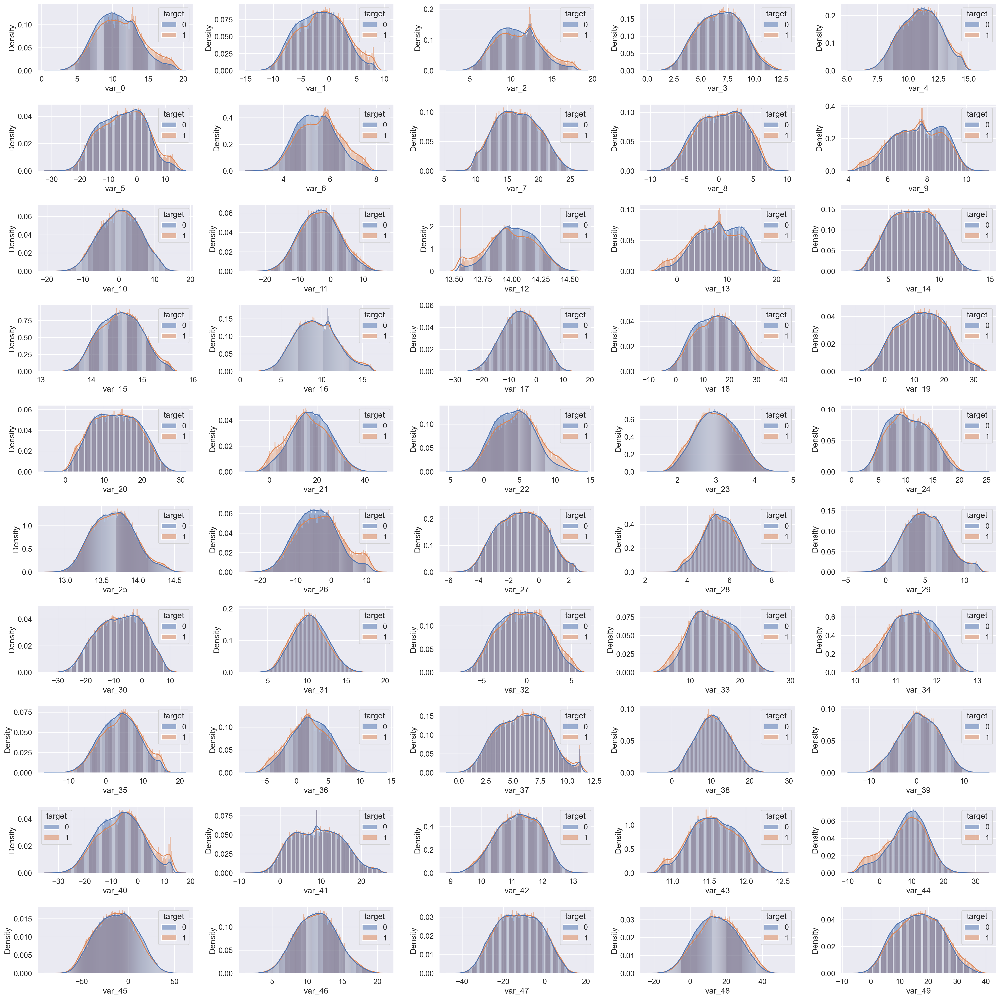

In [16]:
all_features = data_train.drop(columns=["target", "ID_code"]).columns.tolist()

fig, axs = plt.subplots(10, 5, figsize=(25, 25))
axs = axs.reshape(-1)

for i, feature in enumerate(all_features[:50]):
    sns.histplot(data_train, x=feature, hue="target", 
                kde=True, stat='density', common_norm=False, ax=axs[i])
    axs[i].set_xlabel(feature)

plt.tight_layout()

- `var_50`-`var_99`

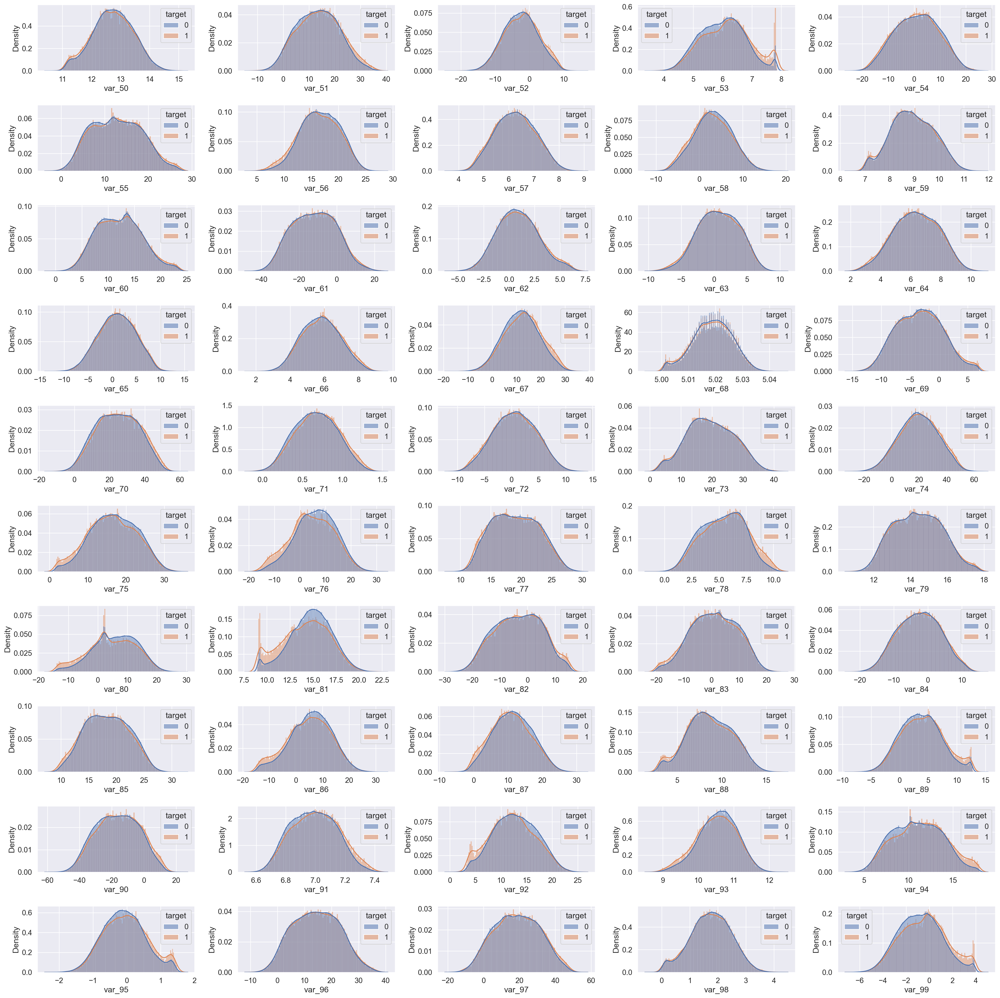

In [17]:
all_features = data_train.drop(columns=["target", "ID_code"]).columns.tolist()

fig, axs = plt.subplots(10, 5, figsize=(25, 25))
axs = axs.reshape(-1)

for i, feature in enumerate(all_features[50:100]):
    sns.histplot(data_train, x=feature, hue="target", 
                kde=True, stat='density', common_norm=False, ax=axs[i])
    axs[i].set_xlabel(feature)

plt.tight_layout()

- `var_100` - `var-149`:

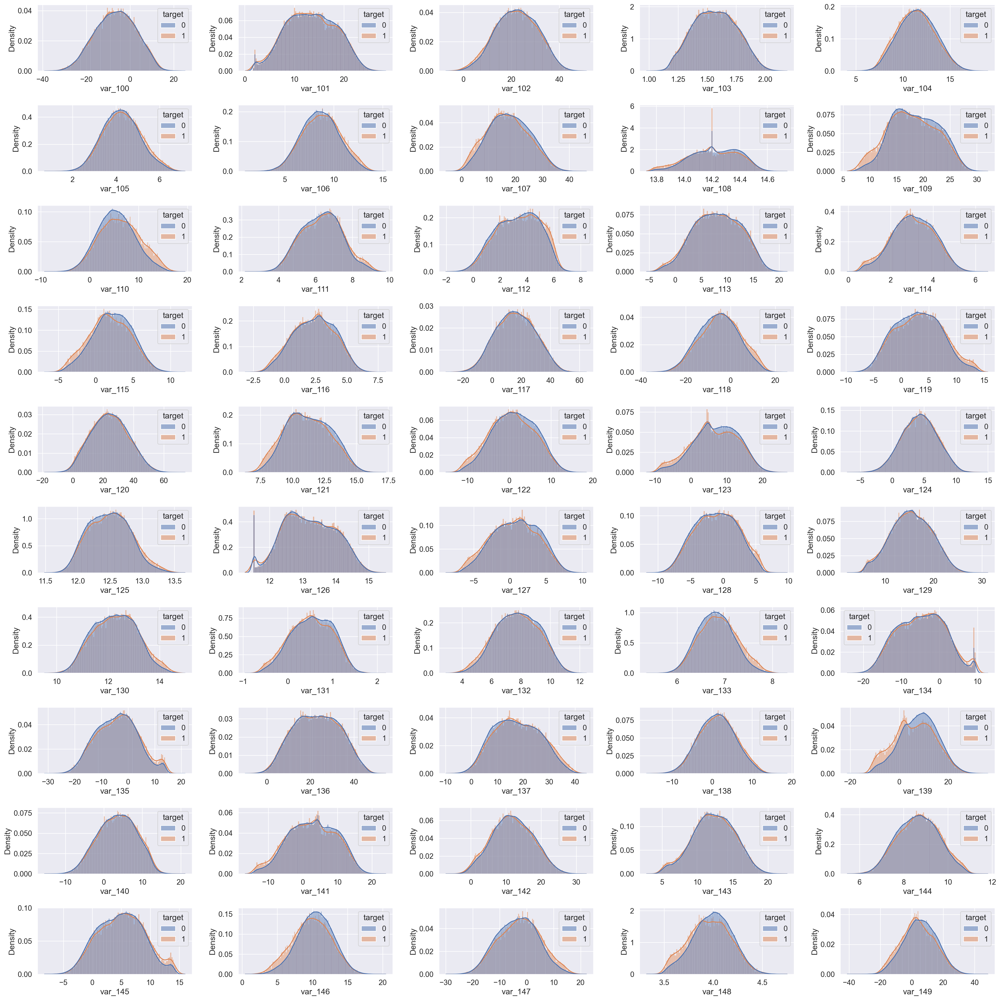

In [18]:
all_features = data_train.drop(columns=["target", "ID_code"]).columns.tolist()

fig, axs = plt.subplots(10, 5, figsize=(25, 25))
axs = axs.reshape(-1)

for i, feature in enumerate(all_features[100:150]):
    sns.histplot(data_train, x=feature, hue="target", 
                kde=True, stat='density', common_norm=False, ax=axs[i])
    axs[i].set_xlabel(feature)

plt.tight_layout()

- `var-150`-`var-199`:

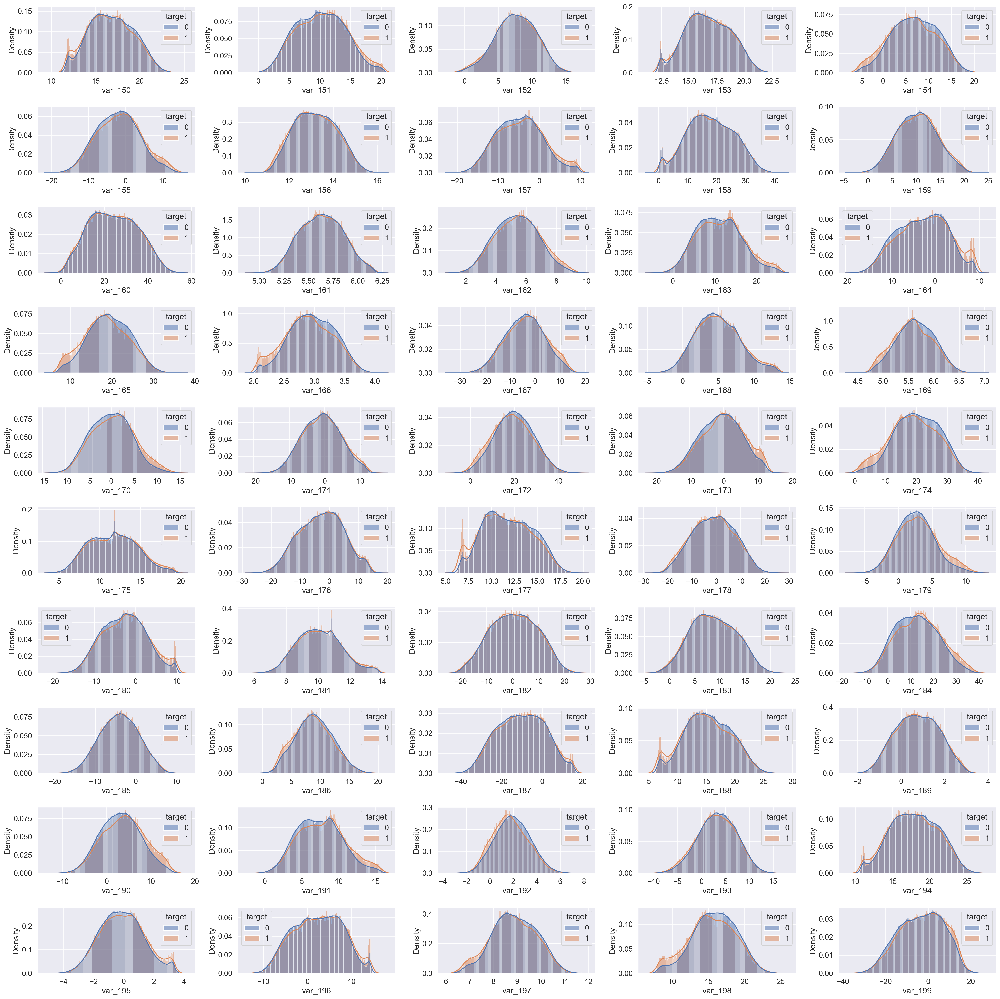

In [19]:
all_features = data_train.drop(columns=["target", "ID_code"]).columns.tolist()

fig, axs = plt.subplots(10, 5, figsize=(25, 25))
axs = axs.reshape(-1)

for i, feature in enumerate(all_features[150:]):
    sns.histplot(data_train, x=feature, hue="target", 
                kde=True, stat='density', common_norm=False, ax=axs[i])
    axs[i].set_xlabel(feature)

plt.tight_layout()

**Мини-вывод:** 
- Все распределения достаточно симметричные
- Есть большое число признаков, распределения которых для отрицательного и положительного класса практически не отличаются (`var_3`, `var_7`, `var_10` и т.д.) - они вряд ли будут полезными
- Потенциально полезные признаки имеют различные распределения для отрицательного и положительного таргета. Это различие прежде всего видно в хвостах распределений для потенциально "средне" важных признаков (`var_78` и др.) и в хвостах + центрах распределений для потенциально самых важных (`var_12`, `var_81` и др).

Также в дальнейшем для Feature engineering'a стоит также посмотреть на scatterplot'ы между признаками и между признаками и таргетом. На примере `var_12` видим, что его значения для ц.п. = 1 лежат в более узком диапазоне, чем для 0 и можно по границам дать однозначный ответ.

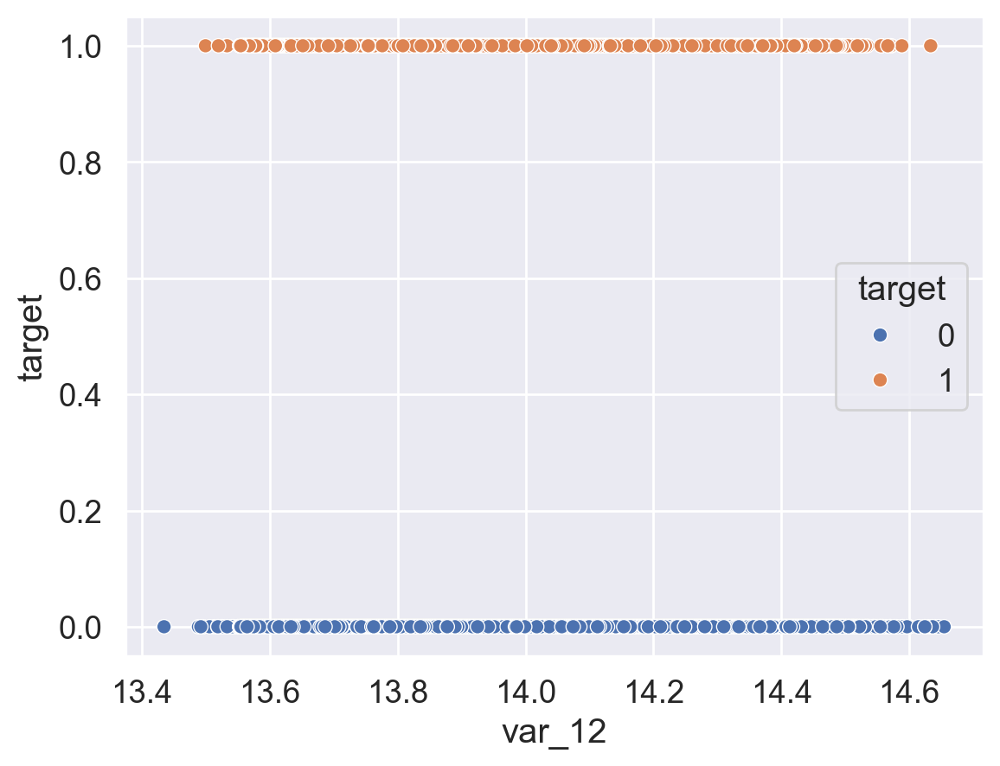

In [27]:
sns.scatterplot(data_train, x="var_12", y="target", hue="target");

## 1.6 Correlations

In [31]:
corr_df = data_train[all_features + ["target"]].corr().abs()
high_corr = corr_df[(corr_df < 1)]
high_corr = high_corr.stack().dropna().sort_values(ascending=False)

In [32]:
high_corr[::2]

var_81   target     8.091733e-02
target   var_139    7.407963e-02
         var_12     6.948928e-02
var_6    target     6.673085e-02
var_110  target     6.427530e-02
                        ...     
var_100  var_177    3.116544e-07
var_27   var_144    1.772502e-07
var_126  var_109    1.313947e-07
var_173  var_6      5.942735e-08
var_75   var_191    2.703975e-08
Length: 20100, dtype: float64

**Мини-вывод:**
- Признаки в датасете между собой практически не коррелируют
- Упомянутые потенциально важные при быстром анализе данных признаки `var_12` и `var_81` имеют с таргетом наибольшую корреляцию

# 2. Baseline models

## 2.1 NaiveBayes

Как было показано выше признаки выше практически не коррелированы между собой, а также имеют симметричные распределения, которые можно хорошо аппроксимировать Гауссом. Попробуем обучить `GaussianNB`:

In [76]:
X_train = data_train.drop(columns=["ID_code", "target"])
y_train = data_train.target

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [77]:
model_gnb = GaussianNB()
cv_results = cross_validate(model_gnb, X_train, y_train, cv=cv, scoring=["roc_auc", "average_precision"], return_train_score=True)

In [78]:
pd.DataFrame({"ROC-AUC_val": [cv_results['test_roc_auc'].mean(), 
                              cv_results['test_roc_auc'].std()],
              "PR-AUC_val": [cv_results['test_average_precision'].mean(), 
                             cv_results['test_average_precision'].std()],
              "ROC-AUC_train": [cv_results['train_roc_auc'].mean(), 
                              cv_results['train_roc_auc'].std()],
              "PR-AUC_train": [cv_results['train_average_precision'].mean(), 
                               cv_results['train_average_precision'].std()]},
            index=["mean", "std"])

,ROC-AUC_val,PR-AUC_val,ROC-AUC_train,PR-AUC_train
mean,0.888371,0.583738,0.890157,0.588941
std,0.003256,0.005954,0.000715,0.001459


**Вывод:** Наивный Байесовский классификатор показывает `ROC-AUC` = **0.8883** на валидации, что сильно превосходит случайную модель (`ROC-AUC` = **0.5**). В дальнейшем можно рассмотреть данную модель как одну из базовых в блендинге/стекинге.

## 2.2 GradienBoosting (LightGBM)

### 2.2.1 Default parameters

Градиентный бустинг на дефолтных параметрах с `early_stopping`:

In [8]:
def cv_lgbm(X, y, cv, preprocess_pipe=None, stopping_rounds=50, return_importances=False, importances_type='split', **params):
    roc_auc_scores = []
    auc_pr_scores = []

    roc_auc_scores_train = []
    auc_pr_scores_train = []   

    n_estimators = []
    importances_list = []

    for (train_indxs, val_indxs) in tqdm(cv.split(X, y), total=cv.n_splits):
        if preprocess_pipe is not None:
            X_train = preprocess_pipe.fit_transform(X.iloc[train_indxs])
            X_val = preprocess_pipe.transform(X.iloc[val_indxs])
        else:
            X_train = X.iloc[train_indxs]
            X_val = X.iloc[val_indxs]

        model = LGBMClassifier(**params, n_jobs=-1)
        model.fit(
            X_train, y.iloc[train_indxs],
            categorical_feature=[],
            eval_X=X_val, eval_y=y.iloc[val_indxs],
            callbacks=[lgb.early_stopping(stopping_rounds=stopping_rounds)],
            eval_metric='auc'
        )

        y_pred_proba_val = model.predict_proba(X_val)[:, 1]
        roc_auc_scores.append(roc_auc_score(y.iloc[val_indxs], y_pred_proba_val))
        auc_pr_scores.append(average_precision_score(y.iloc[val_indxs], y_pred_proba_val))

        y_pred_proba_train = model.predict_proba(X_train)[:, 1]
        roc_auc_scores_train.append(roc_auc_score(y.iloc[train_indxs], y_pred_proba_train))
        auc_pr_scores_train.append(average_precision_score(y.iloc[train_indxs], y_pred_proba_train))

        n_estimators.append(model.n_estimators_)

        if return_importances:
            model.importance_type = importances_type
            imp = model.feature_importances_
            importances_list.append(imp)

    roc_auc_scores = np.array(roc_auc_scores)
    auc_pr_scores = np.array(auc_pr_scores)

    roc_auc_scores_train = np.array(roc_auc_scores_train)
    auc_pr_scores_train = np.array(auc_pr_scores_train)

    metrics_res = pd.DataFrame({
        "ROC-AUC_val": [roc_auc_scores.mean(), roc_auc_scores.std()],
        "PR-AUC_val": [auc_pr_scores.mean(), auc_pr_scores.std()],
        "ROC-AUC_train": [roc_auc_scores_train.mean(), roc_auc_scores_train.std()],
        "PR-AUC_train": [auc_pr_scores_train.mean(), auc_pr_scores_train.std()]
    }, index=["mean", "std"])

    if return_importances:
        importances_df = pd.DataFrame({
            "mean_importance": np.array(importances_list).mean(axis=0),
            "std_importance": np.array(importances_list).std(axis=0)
        }, index=X_train.columns)
    else:
        importances_df = None

    return roc_auc_scores, auc_pr_scores, metrics_res, n_estimators, importances_df

In [ ]:
_, _, cv_res_lgbm_base, _, _ = cv_lgbm(X_train, y_train, cv, n_estimators=750, random_state=42, device_type='gpu', verbose=-1)

In [99]:
cv_res_lgbm_base

,ROC-AUC_val,PR-AUC_val,ROC-AUC_train,PR-AUC_train
mean,0.888208,0.578902,0.985626,0.927278
std,0.002884,0.003050,0.003769,0.017884


**Мини-вывод:**  Базовый градиентный бустинг с использованием `LightGBM` уступает в метриках на валидации `GaussianNB`, а также сильно переобучается.

### 2.2.2 Hyperparameters optimization

In [16]:
def create_objective_lightgbm(X, y, cv, random_state=42, n_estimators=2000):
    def objective(trial):

        params_grid = {
            'num_leaves': trial.suggest_int('num_leaves', 10, 100, step=5),
            'max_depth': trial.suggest_int('max_depth', 3, 15),

            'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.2, log=True),
            'feature_fraction': trial.suggest_float('feature_fraction', 0.3, 1.0),

            'bagging_fraction': trial.suggest_float('bagging_fraction', 0.3, 1.0),
            'bagging_freq': trial.suggest_int('bagging_freq', 0, 10),

            'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True),
            'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True),

            'boost_from_average': trial.suggest_categorical('boost_from_average', [True, False]),

            'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 20, 500, step=10),
            'min_sum_hessian_in_leaf': trial.suggest_float('min_sum_hessian_in_leaf', 1e-3, 10.0, log=True),
            'random_state': random_state,
            'n_estimators': n_estimators,
            'objective': 'binary',
        }


        roc_auc_cv, _, _, _, _ = cv_lgbm(X, y, cv, **params_grid)
        return roc_auc_cv.mean()
    
    return objective

In [ ]:
exp_name = "lgbm_baseline"

objective_func = create_objective_lightgbm(X_train, y_train, cv)
study = optuna.create_study(direction="maximize", study_name="lgbm_baseline", sampler=optuna.samplers.TPESampler(seed=21), storage=OPTUNA_STORAGE, load_if_exists=True)
study.optimize(objective_func, n_trials=200)

Лучшие гиперпараметры:

In [11]:
study = optuna.load_study(study_name='lgbm_baseline', storage=OPTUNA_STORAGE)

In [12]:
baseline_best_params = study.best_params
baseline_best_params

{'num_leaves': 10,
 'max_depth': 7,
 'learning_rate': 0.028401485992761846,
 'feature_fraction': 0.37866638444875267,
 'bagging_fraction': 0.3656726940425887,
 'bagging_freq': 4,
 'reg_alpha': 0.32375142239064447,
 'reg_lambda': 0.0002458053402922169,
 'boost_from_average': True,
 'min_data_in_leaf': 320,
 'min_sum_hessian_in_leaf': 0.0025512464839830325}

In [ ]:
_, _, cv_res_lgbm_base, n_estimators, importances_df = cv_lgbm(X_train, y_train, cv, return_importances=True, n_estimators=2000, random_state=42, **baseline_best_params)

In [86]:
cv_res_lgbm_base

,ROC-AUC_val,PR-AUC_val,ROC-AUC_train,PR-AUC_train
mean,0.898292,0.610825,0.932848,0.723535
std,0.002146,0.004943,0.000745,0.002312


**Мини-вывод:** Подбор гиперпараметров позволил улучшить результат градиентного бустинга, улучшить существенно уменьшил переобучение (однако модель все еще сильно переобучена).

In [88]:
optuna.visualization.plot_optimization_history(study)

In [87]:
optuna.visualization.plot_param_importances(study)

In [89]:
print(n_estimators)

[1998, 1882, 2000, 1981, 1996]


**Мини-вывод:** 
- `LightGBM` с настройкой гиперпараметров показывает значения `ROC-AUC` и `PR-AUC` лучше, чем `GaussianNB`. 
- Байесовская оптимизация с optuna достаточно быстро находит область оптимального множества гиперпараметров (примерно 30-я итерация, хотя итоговое улучшение) и дальше качество слабо меняется. Ожидаемо для бустинга из широкого множества гиперпараметров самым важным оказался с большим отрывом `learning_rate` (`n_estimators` выбирается автоматически с использованием ранней остановки). Стоит отметить, что `n_estimators` на всех 5-ти фолдах имеют значения в районе максимума (2000) -> при дальнейшей настройке можно поднять `n_estimators` и возможно найти более оптимальный (меньший) `learning_rate`.

**Замечание:** Для корректной оценки качества модель необходимо проводить оценку на `NestedCV`, на внутреннем подбирать гиперпараметры, на внешнем (том же, что и для `GaussianNB`) сравнивать с другими моделями. Однако здесь вложенная кросс-валидация не используется, т.к. 1 обучение. с кросс-валидацией `LightGBM` занимает для лучшей модели 90с (45с при обучении на *GPU*) (при другом наборе гиперпараметров время обучения может кратно возрастать). В дальнейшем сократим количество гиперпараметров (например по весам выше) и проведем более честное сравнение.

# 3. EDA, Feature Engineering and Features importancers

## 3.1 Feature importances

Посмотрим на усредненные по фолдам важности признаков (важность по сплиту):

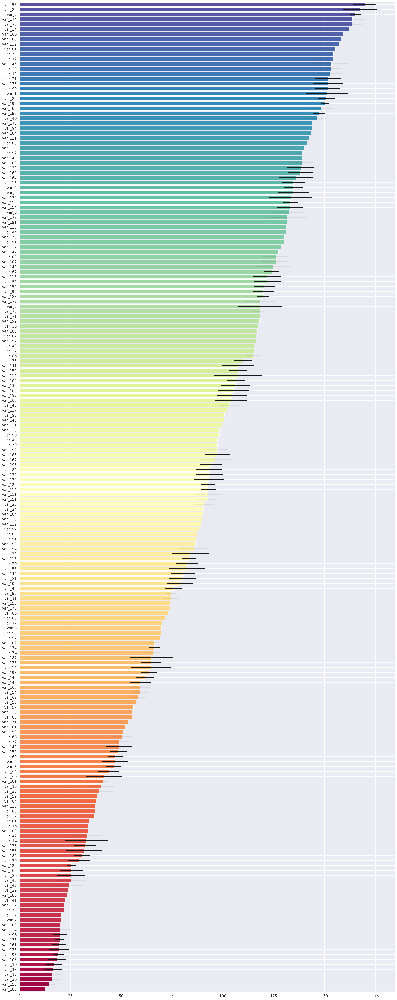

In [29]:
importances_df = importances_df.sort_values(by=["mean_importance"])
colors = sns.color_palette("Spectral", n_colors=len(importances_df))

plt.figure(figsize=(20, 50))
plt.barh(importances_df.index, importances_df["mean_importance"], xerr=importances_df["std_importance"], color=colors)
plt.ylim(-0.5, len(importances_df) - 0.5)
plt.tight_layout()


Вернемся к графикам плотностей для самых важных признаков:

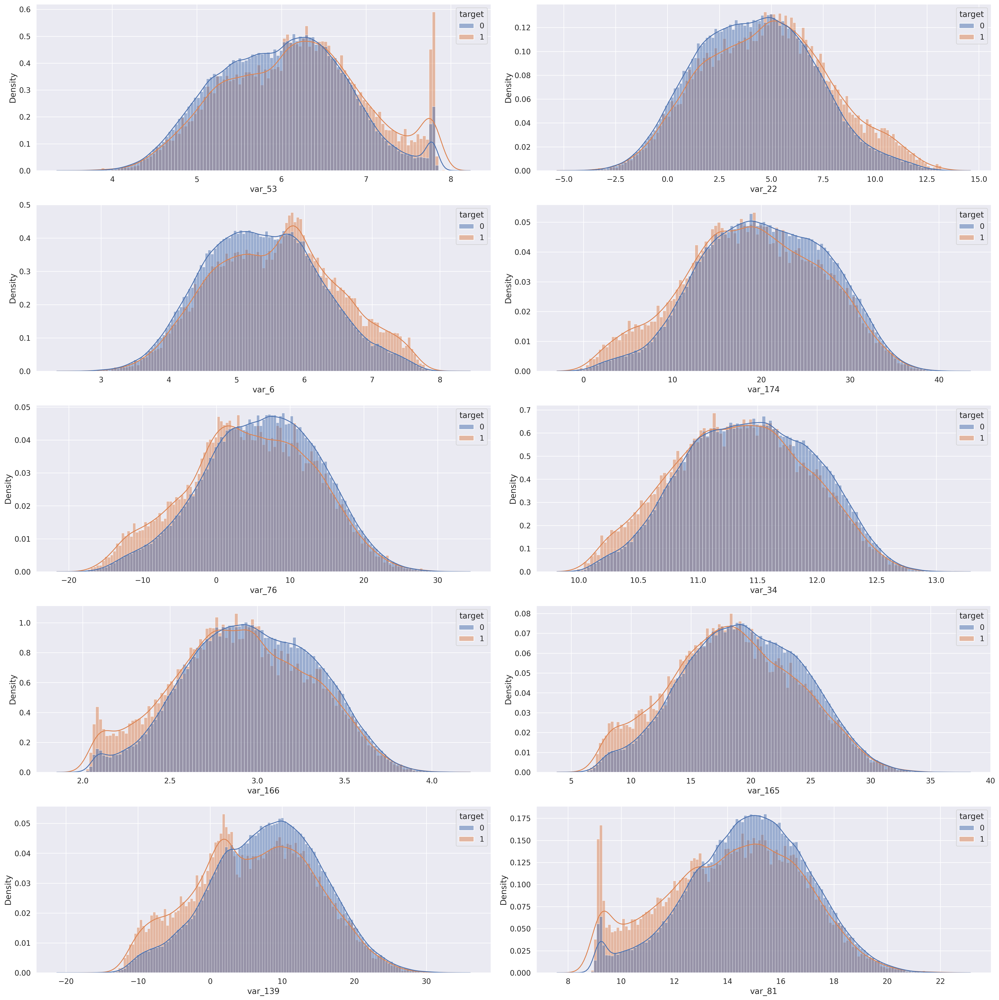

In [30]:
top_n = 10
most_important_features = importances_df.sort_values(by="mean_importance", ascending=False)[:top_n].index.tolist()

fig, axs = plt.subplots(5, 2, figsize=(25, 25))
axs = axs.reshape(-1)

for i, feature in enumerate(most_important_features):
    sns.histplot(data_train, x=feature, hue="target", 
                kde=True, stat='density', common_norm=False, ax=axs[i])
    axs[i].set_xlabel(feature)

plt.tight_layout()

Для самых бесполезных признаков:

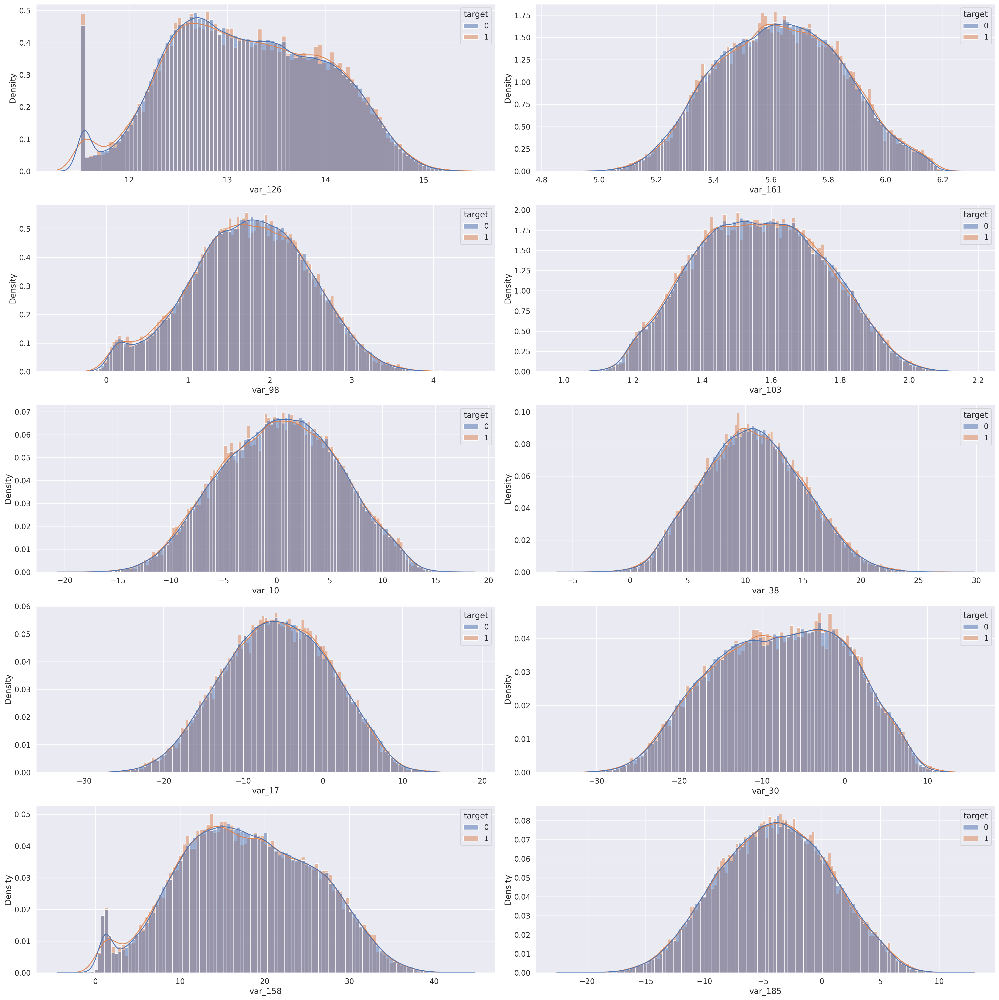

In [31]:
top_n = 10
most_useless_features = importances_df.sort_values(by="mean_importance", ascending=False)[-top_n:].index.tolist()

fig, axs = plt.subplots(5, 2, figsize=(25, 25))
axs = axs.reshape(-1)

for i, feature in enumerate(most_useless_features):
    sns.histplot(data_train, x=feature, hue="target", 
                kde=True, stat='density', common_norm=False, ax=axs[i])
    axs[i].set_xlabel(feature)

plt.tight_layout()

**Мини-вывод:** Ожидаемо самые важные признаки - признаки, распределения которых для разных значений таргета отличается. Будем придумывать новые признаки на основе статистик, которые позволят их разделить.

## 3.2 Forward feature selection

Также сразу попробуем провести отбор признаков на основе их важности.

In [ ]:
features_by_imp = importances_df.sort_values(by="mean_importance", ascending=False).index.tolist()

fs_res = {}
for n_feat in range(1, 201):
    _, _, cv_res_inner, _, _ = cv_lgbm(X_train[features_by_imp[:n_feat]], y_train, cv, return_importances=True, n_estimators=2000, random_state=42, verbose=-1, **baseline_best_params)
    fs_res[n_feat] = cv_res_inner["ROC-AUC"]["mean"]
    print(fs_res)

In [168]:
features_metrics_df = pd.DataFrame({"ROC_AUC": fs_res.values()}, index=fs_res.keys()).sort_values(by="ROC_AUC", ascending=False)
features_metrics_df.head(20)

,ROC_AUC
200,0.898306
190,0.898224
179,0.898206
176,0.898197
194,0.898195
173,0.898160
197,0.898159
192,0.898146
167,0.898131
180,0.898122


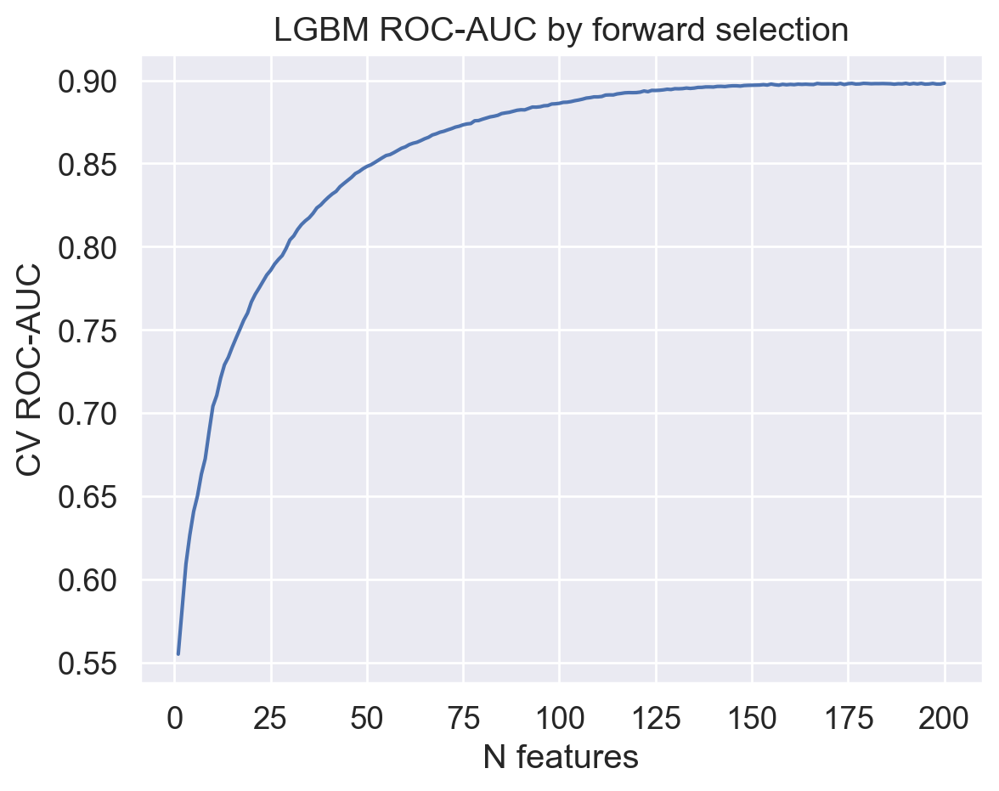

In [171]:
sns.lineplot(y=fs_res.values(), x=fs_res.keys())
plt.xlabel("N features")
plt.ylabel("CV ROC-AUC")
plt.title("LGBM ROC-AUC by forward selection");

In [184]:
features_metrics_df.iloc[0].values, features_metrics_df.iloc[55].values

(array([0.89830634]), array([0.89656173]))

**Вывод:** Видим, что лучшее качество все равно достигается на полном наборе признаков, однако улучшение при включении самых неважных (N_features 150-200) практически отсутствует. Учитывая, что стандартное отклонение `ROC-AUC` между фолдами примерно 2e-3 в итоговой модели мы можем попробовать убрать 50-60 самых неважных по feature importances признаков. Также стоило бы для каждого набора тюнить гиперпараметры, но это займет очень много времени и вряд ли даст существенный прирост в целевой метрике.

## 3.3 Feature engineering

Не будем убирать наименее важные признаки, возможно их трансформации смогут внести более существенный вклад.

### 3.3.1 Row-wise statistics

Попробуем добавить статистики по строкам:

In [ ]:
data_train["features_mean"] = data_train.drop(columns=["target", "ID_code"]).mean(axis=1)
data_train["features_min"] = data_train.drop(columns=["target", "ID_code"]).min(axis=1)
data_train["features_max"] = data_train.drop(columns=["target", "ID_code"]).max(axis=1)
data_train["features_std"] = data_train.drop(columns=["target", "ID_code"]).std(axis=1)
data_train["features_sum"] = data_train.drop(columns=["target", "ID_code"]).sum(axis=1)

In [ ]:
X_train = data_train.drop(columns=["target", "ID_code"])
y_train = data_train["target"]
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

_, _, cv_res_lgbm_base, n_estimators, importances_df = cv_lgbm(X_train, y_train, cv, return_importances=True, n_estimators=2000, 
                                                               random_state=42, verbose=-1, device_type='gpu',
                                                               **baseline_best_params)

In [25]:
cv_res_lgbm_base

,ROC-AUC_val,PR-AUC_val,ROC-AUC_train,PR-AUC_train
mean,0.897728,0.609427,0.932022,0.720564
std,0.002672,0.004919,0.001623,0.004104


### 3.3.2 Frequency features

- `round(4) frequency features`:

In [11]:
all_features = data_train.drop(columns=["target", "ID_code"]).columns.tolist()

Можно воспользоваться `CountEncoder` из sklearn, однако он учится порядка 30с на данных, напишем свой трансформер и сравним с sklearn реализацией:

In [13]:
count_encoder = CountEncoder(cols=all_features, handle_unknown='return_nan')
count_encoder.fit(data_train.drop(columns=["target"]))
data_test_freq_sklearn = count_encoder.transform(data_test)

In [138]:
class MyCountEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, cols, feat_suffix='_freq', round_val=4, fillna_val=None):
        self.cols = cols
        self.feat_suffix = feat_suffix
        self.fillna_val = fillna_val
        self.feat_freq_ = None
        self.round_val = round_val

    def fit(self, X, y=None):
        self.feat_freq_ = {col: X[col].round(self.round_val).value_counts() for col in self.cols}
        return self

    def transform(self, X):
        new_cols = {}
        for col in self.cols:
            new_cols[col + self.feat_suffix] = X[col].round(self.round_val).map(self.feat_freq_[col])

        new_feat_df = pd.DataFrame(new_cols, index=X.index)
        if self.fillna_val is not None:
            new_feat_df = new_feat_df.fillna(self.fillna_val)

        return pd.concat([X, new_feat_df], axis=1)

In [139]:
my_count_encoder = MyCountEncoder(cols=all_features)
my_count_encoder.fit(data_train.drop(columns=["target"]))
data_test_freq_my = my_count_encoder.transform(data_test)

Данный код работает менее 3с (10 раз быстрее). Проверки:

In [140]:
assert data_test_freq_my.filter(like="freq").shape == data_test_freq_sklearn.filter(like="var_").shape
assert data_test_freq_my.isna().sum().sum() == data_test_freq_sklearn.isna().sum().sum()
assert np.allclose(data_test_freq_my.filter(like="freq").sample(500, random_state=42).fillna(0).values,
              data_test_freq_sklearn.filter(like="var").fillna(0).sample(500, random_state=42).values)

На тесте появляется много пропусков, если не подавать параметр `fillna_val`:

In [136]:
data_test_freq_my.isna().sum().sum()

np.int64(10831844)

Если подавать:

In [92]:
my_count_encoder = MyCountEncoder(cols=all_features, fillna_val=0)
my_count_encoder.fit(data_train.drop(columns=["target"]))
data_test_freq_my = my_count_encoder.transform(data_test)
data_test_freq_my.isna().sum().sum()

np.int64(0)

In [ ]:
#в cv_lgbm именно pipeline, чтобы иметь возможность при необходимости последовательные преобразования проводить
prep_pipe = Pipeline([('freq_cols', MyCountEncoder(cols=all_features, fillna_val=0))])

_, _, cv_res_lgbm_freq_feat, n_estimators, importances_df_freq_feat = cv_lgbm(X_train, y_train, cv, preprocess_pipe=prep_pipe,
                                                                              return_importances=True, n_estimators=2000, 
                                                                              random_state=42, device_type='gpu',
                                                                              **baseline_best_params)

In [103]:
cv_res_lgbm_freq_feat

,ROC-AUC_val,PR-AUC_val,ROC-AUC_train,PR-AUC_train
mean,0.898148,0.610955,0.934017,0.727835
std,0.002525,0.004605,0.000737,0.003076


Видим, что результат примерно тот же.

- `round(3) frequency features`:

In [143]:
my_count_encoder = MyCountEncoder(cols=all_features, round_val=3)
my_count_encoder.fit(data_train.drop(columns=["target"]))
data_test_freq_my = my_count_encoder.transform(data_test)
data_test_freq_my.isna().sum().sum()

np.int64(527849)

На тесте пропусков намного меньше, кажется, что это может помочь при финальном предсказании.

In [ ]:
prep_pipe = Pipeline([('freq_cols', MyCountEncoder(cols=all_features, fillna_val=0, round_val=3))])

_, _, cv_res_lgbm_freq_feat, n_estimators, importances_df_freq_feat = cv_lgbm(X_train, y_train, cv, preprocess_pipe=prep_pipe,
                                                                              return_importances=True, n_estimators=2000, 
                                                                              random_state=42, device_type='gpu',
                                                                              **baseline_best_params)

In [145]:
cv_res_lgbm_freq_feat

,ROC-AUC_val,PR-AUC_val,ROC-AUC_train,PR-AUC_train
mean,0.897844,0.610058,0.933245,0.724331
std,0.002197,0.004012,0.001788,0.004366


Ситуация аналогичная.

- `round(2) frequency features`

In [146]:
my_count_encoder = MyCountEncoder(cols=all_features, round_val=2)
my_count_encoder.fit(data_train.drop(columns=["target"]))
data_test_freq_my = my_count_encoder.transform(data_test)
data_test_freq_my.isna().sum().sum()

np.int64(28602)

In [ ]:
prep_pipe = Pipeline([('freq_cols', MyCountEncoder(cols=all_features, fillna_val=0, round_val=2))])

_, _, cv_res_lgbm_freq_feat, n_estimators, importances_df_freq_feat = cv_lgbm(X_train, y_train, cv, preprocess_pipe=prep_pipe,
                                                                              return_importances=True, n_estimators=2000, 
                                                                              random_state=42, device_type='gpu',
                                                                              **baseline_best_params)

In [148]:
cv_res_lgbm_freq_feat

,ROC-AUC_val,PR-AUC_val,ROC-AUC_train,PR-AUC_train
mean,0.897521,0.609448,0.935194,0.730927
std,0.002613,0.003899,0.000991,0.003101


**Вывод:** `CountEncoder` не позволил улучшить качество модели ни при каком округлении исходных признаков. 

### 3.3.3 Unique value features

Попробуем добавить признак уникальности значения (о причинах добавления смотреть пункты ниже)

In [36]:
class UniqueEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, cols, feat_suffix='_unique'):
        self.cols = cols
        self.feat_suffix = feat_suffix
        self.unique_mask_ = {}
    
    def fit(self, X, y=None):
        self.unique_mask_ = {
            col: ~X[col].duplicated(keep=False) for col in self.cols
        }
        return self
    
    def transform(self, X):
        new_cols = {}
        for col in self.cols:
            new_cols[col + self.feat_suffix] = self.unique_mask_[col].astype(int)
        
        return pd.concat([X, pd.DataFrame(new_cols, index=X.index)], axis=1)

In [6]:
base_features = data_train.filter(like="var").columns.tolist()
len(base_features)

200

In [ ]:
X_train = data_train[base_features]
prep_pipe = Pipeline([('freq_cols', UniqueEncoder(cols=base_features))])

_, _, cv_res_lgbm_freq_feat, n_estimators, importances_df_freq_feat = cv_lgbm(X_train, y_train, cv, preprocess_pipe=prep_pipe,
                                                                              return_importances=True, n_estimators=2000, 
                                                                              random_state=42, device_type='gpu',
                                                                              **baseline_best_params)

In [39]:
cv_res_lgbm_freq_feat

,ROC-AUC_val,PR-AUC_val,ROC-AUC_train,PR-AUC_train
mean,0.897221,0.609108,0.932985,0.724484
std,0.002285,0.004509,0.001100,0.001778


Аналогично никакого улучшения

### 3.3.4 Bins discretization

Как показывалось выше, принципиальные различия в распределениях для разных значений таргета находятся в хвостах распределений. Дискретизация может помочь выделить эти значения:

- `uniform` stategy

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
X_train = data_train[base_features]

kbins = KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='uniform')
X_train_bins = pd.DataFrame(kbins.fit_transform(X_train), columns=list(map(lambda x: x + "_bins", base_features)))

X_train = pd.concat([X_train, X_train_bins], axis=1)
y_train = data_train["target"]

_, _, cv_res_lgbm_freq_feat, n_estimators, importances_df_freq_feat = cv_lgbm(X_train, y_train, cv, verbose=-1,
                                                                              return_importances=True, n_estimators=2000, 
                                                                              random_state=42, device_type='gpu',
                                                                              **baseline_best_params)

In [15]:
cv_res_lgbm_freq_feat

,ROC-AUC_val,PR-AUC_val,ROC-AUC_train,PR-AUC_train
mean,0.897794,0.609035,0.932250,0.721489
std,0.002447,0.004619,0.001327,0.003787


- `quantile` stategy

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
X_train = data_train[base_features]

kbins = KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='quantile')
X_train_bins = pd.DataFrame(kbins.fit_transform(X_train), columns=list(map(lambda x: x + "_bins", base_features)))

X_train = pd.concat([X_train, X_train_bins], axis=1)
y_train = data_train["target"]

_, _, cv_res_lgbm_freq_feat, n_estimators, importances_df_freq_feat = cv_lgbm(X_train, y_train, cv, verbose=-1,
                                                                              return_importances=True, n_estimators=2000, 
                                                                              random_state=42, device_type='gpu',
                                                                              **baseline_best_params)

In [17]:
cv_res_lgbm_freq_feat

,ROC-AUC_val,PR-AUC_val,ROC-AUC_train,PR-AUC_train
mean,0.897416,0.60915,0.932133,0.720862
std,0.002561,0.00394,0.000792,0.003599


# 4. RandomForest

In [18]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
X_train = data_train[base_features]

model_rf= RandomForestClassifier(n_estimators=500, n_jobs=-1)
cv_results = cross_validate(model_rf, X_train, y_train, cv=cv, verbose=2, scoring=["roc_auc", "average_precision"], return_train_score=True)

In [23]:
pd.DataFrame({"ROC-AUC_val": [cv_results['test_roc_auc'].mean(), 
                              cv_results['test_roc_auc'].std()],
              "PR-AUC_val": [cv_results['test_average_precision'].mean(), 
                             cv_results['test_average_precision'].std()],
              "ROC-AUC_train": [cv_results['train_roc_auc'].mean(), 
                              cv_results['train_roc_auc'].std()],
              "PR-AUC_train": [cv_results['train_average_precision'].mean(), 
                               cv_results['train_average_precision'].std()]},
            index=["mean", "std"])

,ROC-AUC_val,PR-AUC_val,ROC-AUC_train,PR-AUC_train
mean,0.843197,0.471821,1.000000e+00,1.000000e+00
std,0.004539,0.007553,4.965068e-17,1.110223e-16


# Submission

In [246]:
final_model =  LGBMClassifier(**baseline_best_params, n_jobs=-1, n_estimators=2000, random_state=42)
final_model.fit(X_train, y_train, categorical_feature=[])

,boosting_type,'gbdt'
,num_leaves,10
,max_depth,7
,learning_rate,0.028401485992761846
,n_estimators,2000
,subsample_for_bin,200000
,objective,None
,class_weight,None
,min_split_gain,0.0
,min_child_weight,0.001
,min_child_samples,20


In [ ]:
# y_pred_test = final_model.predict(data_test.drop(columns=["ID_code"]))

In [252]:
y_pred_test = final_model.predict_proba(data_test.drop(columns=["ID_code"]))[:, 1]

In [253]:
data_test.isna().sum().sum()

np.int64(0)

In [254]:
y_pred_test

array([0.07175199, 0.19888674, 0.22653846, ..., 0.00543162, 0.06508352,
       0.09617901], shape=(200000,))

In [255]:
sub_data = pd.DataFrame({"ID_code": data_test["ID_code"].values})
sub_data["target"] = y_pred_test 
sub_data.to_csv("submission.csv", index=False)

In [256]:
sub_data.target.value_counts()/data_test.shape[0]

target
0.071752    0.000005
0.198887    0.000005
0.226538    0.000005
0.178701    0.000005
0.043789    0.000005
              ...   
0.041621    0.000005
0.007746    0.000005
0.005432    0.000005
0.065084    0.000005
0.096179    0.000005
Name: count, Length: 200000, dtype: float64